<a href="https://colab.research.google.com/github/danielaterra/shape-features/blob/main/MV_shapeFeatures_versao2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Conecta gdrive #

In [ ]:
from google.colab import drive
drive.mount("/content/drive/")

In [ ]:
sys.path.append(os.path.join(os.getcwd(), os.pardir))

#R libs

In [7]:
# activate R magic
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [8]:
%%R
#reload_ext rpy2.ipython
#config IPCompleter.greedy= True
#config InlineBackend.figure_format = 'retina'

NULL


In [9]:
# Install if it's your first time to run
%%R
install.packages("ggplot2")
install.packages("ggthemes")
install.packages("GGally")
install.packages("Hotelling")
install.packages("reshape2")
install.packages("readr")
install.packages("tidyverse")
install.packages("dplyr")

(as ‘lib’ is unspecified)







	‘/tmp/RtmpnDC5Ma/downloaded_packages’

(as ‘lib’ is unspecified)







	‘/tmp/RtmpnDC5Ma/downloaded_packages’

(as ‘lib’ is unspecified)







	‘/tmp/RtmpnDC5Ma/downloaded_packages’

(as ‘lib’ is unspecified)







	‘/tmp/RtmpnDC5Ma/downloaded_packages’

(as ‘lib’ is unspecified)







	‘/tmp/RtmpnDC5Ma/downloaded_packages’

(as ‘lib’ is unspecified)







	‘/tmp/RtmpnDC5Ma/downloaded_packages’

(as ‘lib’ is unspecified)







	‘/tmp/RtmpnDC5Ma/downloaded_packages’

(as ‘lib’ is unspecified)







	‘/tmp/RtmpnDC5Ma/downloaded_packages’



In [10]:
%%R
#library(radiant)
library(ggplot2)
library(ggthemes)
library(GGally)
library(Hotelling)
library(reshape2)
library(readr)



#Python libs
(vide como dar bypass em erros libs python)

Abrir link módulo /usr/local/lib/python3.10/dist-packages/ggplot/utils.py  
1. Alterar de: pd.tslib.Timestamp
      Para: pd.Timestamp
Salvar e reexecutar

Abrir link módulo /usr/local/lib/python3.10/dist-packages/ggplot/stats/smoothers.py
1. Alterar de: from pandas.lib import Timestamp
         para: from pandas import Timestamp
2. Alterar de: date_types = (
    		pd.tslib.Timestamp,
       para: date_types = (
    		pd.Timestamp,
Salva e reexecuta

In [19]:
!pip install ggplot
!pip install plotnine

In [20]:
import numpy as np
import pandas as pd
from math import sqrt
import os
import sys
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from skimage import morphology, measure
from skimage.draw import polygon, polygon_perimeter
from scipy.spatial.distance import cdist
from scipy.stats import kurtosis
from random import randint
from random import sample
import xgboost as xgb
import csv
import rpy2
import matplotlib
SMALL_SIZE = 8
matplotlib.rc('font', size=SMALL_SIZE-1)
matplotlib.rc('axes', titlesize=SMALL_SIZE)
from matplotlib import pyplot as plt
from scipy import stats
from scipy.stats import ttest_1samp, ttest_ind, norm
from plotnine import ggplot, aes, facet_grid, labs, geom_col, theme, theme_tufte
from ggplot import *
import utils.shapeFeatures_extraction


# Multivariate Analysis#

## Functions ##

In [66]:
import sys
sys.path.append('/content/drive/MyDrive/PDSE')
sys.path.append('/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis')


## Lê csv estatisticas ##

In [67]:
## Recupera arquivo
stats = pd.read_csv('/content/drive/MyDrive/PDSE/stats.csv', index_col=0)

In [68]:
stats.keys()

Index(['Unnamed: 0', 'image_id', 'cell_id', 'bethesda', 'areaN', 'areaC',
       'perimeterN', 'perimeterC', 'major_axisN', 'major_axisC', 'minor_axisN',
       'minor_axisC', 'equivalent_diameterN', 'equivalent_diameterC',
       'radial_distance_maxN', 'radial_distance_maxC', 'radial_distance_meanN',
       'radial_distance_meanC', 'radial_distance_sdN', 'radial_distance_sdC',
       'eccentricityN', 'eccentricityC', 'circularityN', 'circularityC',
       'convexityN', 'convexityC', 'solidityN', 'solidityC', 'extentN',
       'extentC', 'RAN', 'RAC', 'RIN', 'RIC', 'radial_distance_EN',
       'radial_distance_EC', 'radial_distance_kurtoseN',
       'radial_distance_kurtoseC', 'FDN', 'FDC', 'Use_curv1N', 'Use_curv1C',
       'Use_curv2N', 'Use_curv2C', 'Use_curv3N', 'Use_curv3C',
       'major_axis_angleN', 'major_axis_angleC', 'area_NC', 'perimetro_NC',
       'major_axis_NC', 'minor_axis_NC', 'nucleus_position',
       'sub_major_axis_angle_NC', 'convexity_NC'],
      dtype='object'

In [69]:

features = ['areaN', 'areaC','perimeterN', 'perimeterC', 'major_axisN', 'major_axisC', 'minor_axisN', \
       'minor_axisC', 'equivalent_diameterN', 'equivalent_diameterC', \
       'radial_distance_maxN', 'radial_distance_maxC', 'radial_distance_meanN', \
       'radial_distance_meanC', 'radial_distance_sdN', 'radial_distance_sdC', \
       'eccentricityN', 'eccentricityC', 'circularityN', 'circularityC', \
       'convexityN', 'convexityC', 'solidityN', 'solidityC', 'extentN', \
       'extentC', 'RAN', 'RAC', 'RIN', 'RIC', 'radial_distance_EN', \
       'radial_distance_EC', 'radial_distance_kurtoseN', 'radial_distance_kurtoseC', 'Use_curv1N', 'Use_curv1C', \
       'Use_curv2N', 'Use_curv2C', 'Use_curv3N', 'Use_curv3C', \
       'major_axis_angleN', 'major_axis_angleC', 'area_NC', 'perimetro_NC', \
       'major_axis_NC', 'minor_axis_NC', 'nucleus_position', 'sub_major_axis_angle_NC', 'convexity_NC']


## **Correlação entre atributos do Núcleo das células**##

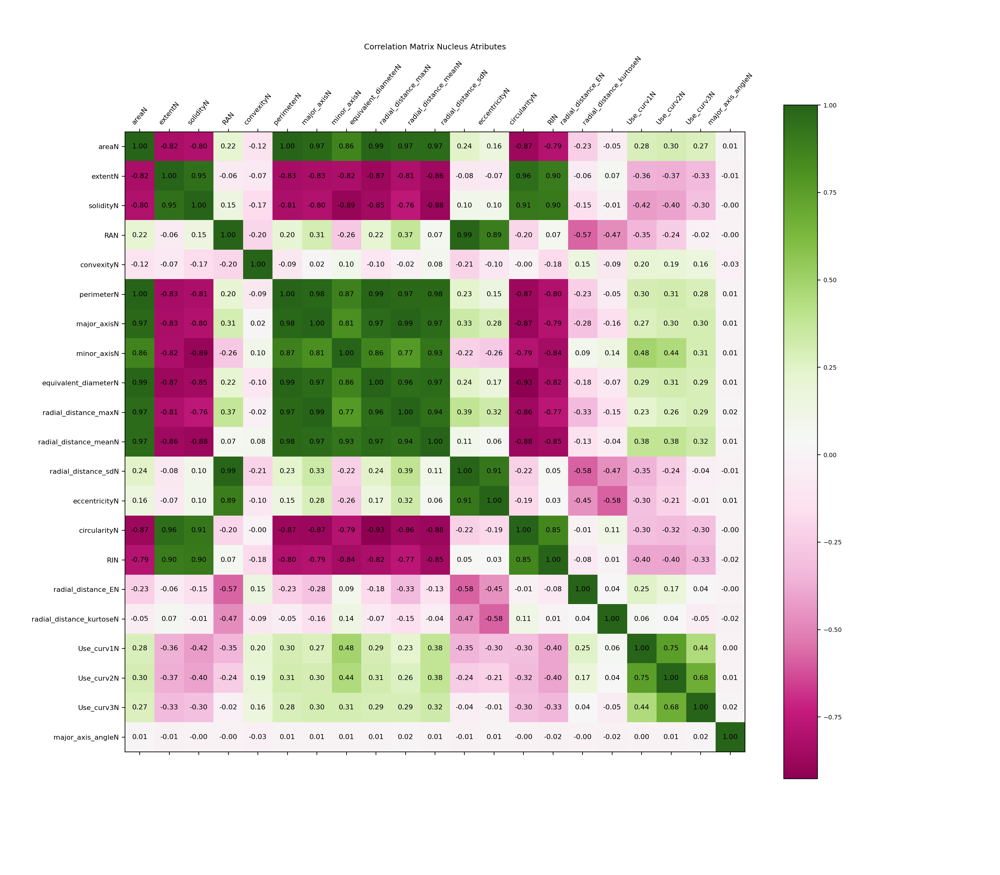

In [70]:
cols = ['areaN', 'extentN', 'solidityN', 'RAN', 'convexityN', \
       'perimeterN', 'major_axisN',  'minor_axisN', \
       'equivalent_diameterN',  'radial_distance_maxN', 'radial_distance_meanN', \
       'radial_distance_sdN',  'eccentricityN', 'circularityN', 'RIN', 'radial_distance_EN', 'radial_distance_kurtoseN', \
       'Use_curv1N', 'Use_curv2N', 'Use_curv3N', 'major_axis_angleN']


stats_1 = stats[cols]
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=50)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)
plt.title('Correlation Matrix Nucleus Atributes', fontsize=9);
filename = 'CorrNucleus.pdf'

fig.savefig(fname="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/"+filename)


Conforme matriz acima, para cada grupo de atributos fortemente correlacionados, apenas um deles será mantido:


1.   **area**, perimetro, major_axis, equivalent_diameter, radia_distance_max e radia_distance_mean. Area será mantida.
2.   **extent** (Ratio of pixels in the region to pixels in the total bounding box), solidity (Ratio of pixels in the region to pixels of the convex hull image) e circularidade (p^2/($pi*A)) e RI (indice de rugosidade). Será mantida extent.
3. **RAN** (taxa  entre: distancias_radiais_maiores_que_a_média/(N* dist_radial_média), radial_distance_sdN (desvio padrão das distancias radiais) e excentricidade (perimetro_convexHull/perimetro) Será mantido RAN.

### Mat Cor restantes ###

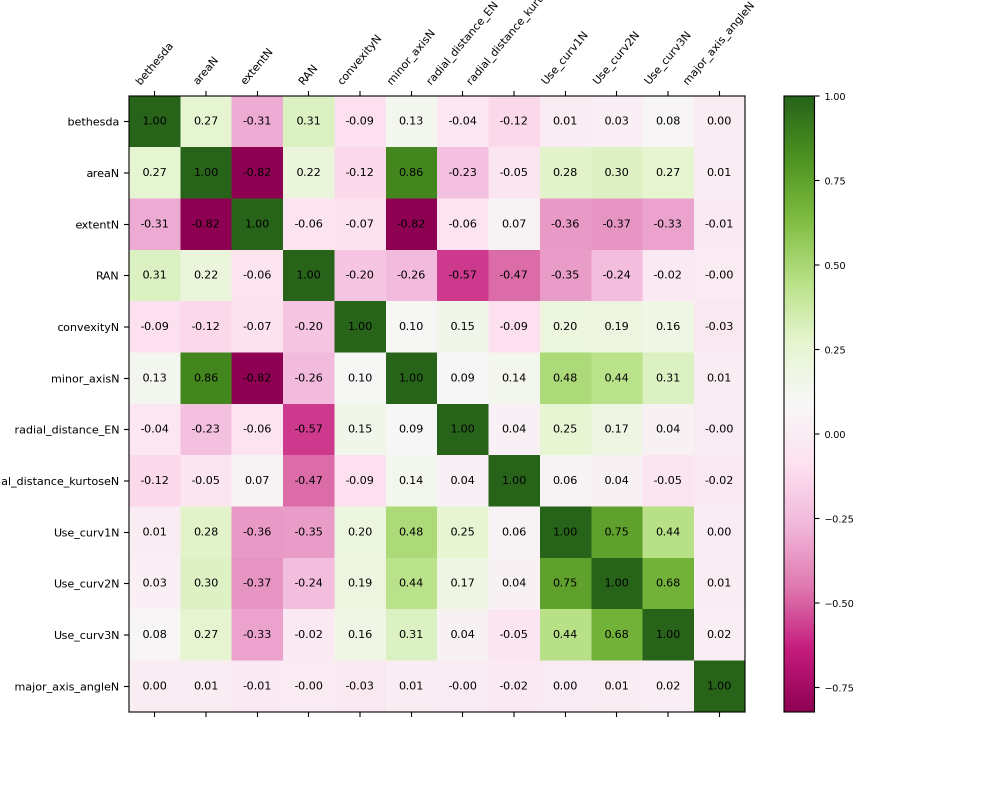

In [71]:
cols_nucleo = ['bethesda','areaN', 'extentN', 'RAN', 'convexityN', 'minor_axisN', \
               'radial_distance_EN', 'radial_distance_kurtoseN',
               'Use_curv1N', 'Use_curv2N', 'Use_curv3N', 'major_axis_angleN']


stats_1 = stats[cols_nucleo]
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=50)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)

In [72]:

vars = ['areaN', 'extentN', 'RAN', 'convexityN', 'minor_axisN', \
        'radial_distance_EN', 'radial_distance_kurtoseN',
        'Use_curv1N', 'Use_curv3N', 'major_axis_angleN']


### **Analise de faixa dos atributos do nucleo** ###

### Python ###

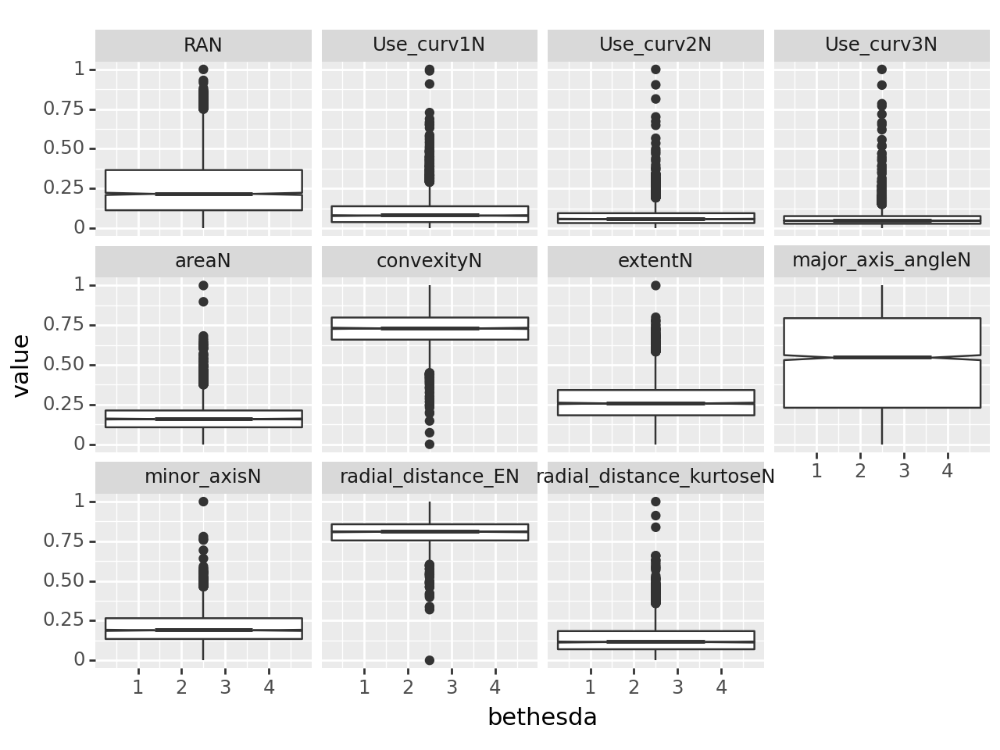

In [73]:
from plotnine import *
from plotnine.data import *
stats_1_melt = pd.melt(stats[cols_nucleo], id_vars='bethesda')
p = ggplot(stats_1_melt, aes(x='bethesda', y='value', col='bethesda')) \
  +geom_boxplot(notch = True) \
 +facet_wrap('~variable')

'''
p = ggplot(stats_1_melt, aes(x= 'variable', y= 'value', col=stats_1_melt.variable, \
                         color= stats_1_melt.variable)) + \
 geom_boxplot(aes(x='bethesda'), notch=True)  \
 + theme(figure_size=(20,8), \
       axis_line=element_line(size=1, colour="black"), \
         panel_grid_major=element_line(colour="#d3d3d3"), \
       text=element_text(size=8, angle=15), \
            panel_border=element_blank(), \
        panel_background=element_blank(), \
      axis_title_x = element_text(size=12, angle = 0), \
      axis_title_y = element_text(size=12, angle=0)) \
      + facet_wrap('~ variable')'''


#filename = 'NucleoBoxplot.pdf'
#ggsave(p,filename =filename, path ="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis", width=15, height=10)
p.draw()

### R ###

In [74]:
cols_nucleo = ['bethesda','areaN', 'extentN', 'RAN', 'convexityN', 'minor_axisN', \
               'radial_distance_EN', 'radial_distance_kurtoseN',
               'Use_curv1N', 'Use_curv3N', 'major_axis_angleN']
statsN = stats[cols_nucleo]
statsN.to_csv("/content/drive/MyDrive/PDSE/statsN.csv")

New names:
• `` -> `...1`


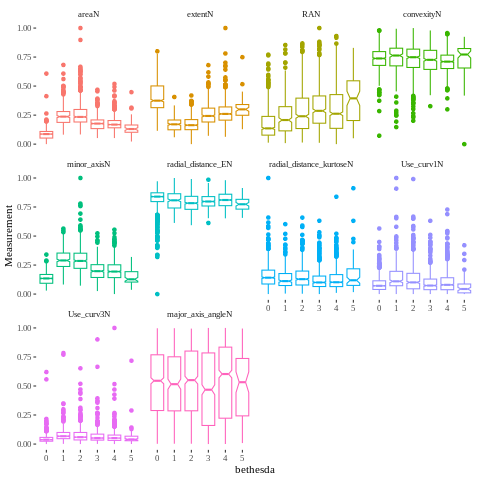

In [75]:
%%R
statsR <- read_csv("/content/drive/MyDrive/PDSE/statsN.csv",col_types =
                   cols(...1 = col_skip(), bethesda = col_factor(levels = c("0","1", "2", "3", "4", "5"))))

statsR.molten <- reshape2::melt(statsR, measure.vars=2:11, value.name = "Measurement", variable.name="Feature")

library(repr)
p = ggplot(statsR.molten, aes(x=bethesda, y=Measurement, col=Feature)) + geom_boxplot(show.legend = FALSE, notch=TRUE) +  theme_tufte() +   facet_wrap(~Feature)

print(p, saved=grid::viewport(width=unit(20, 'inch'), height=unit(20, 'inch')))

### **T-Test - teste das médias para valores de atributos entre classes** ###

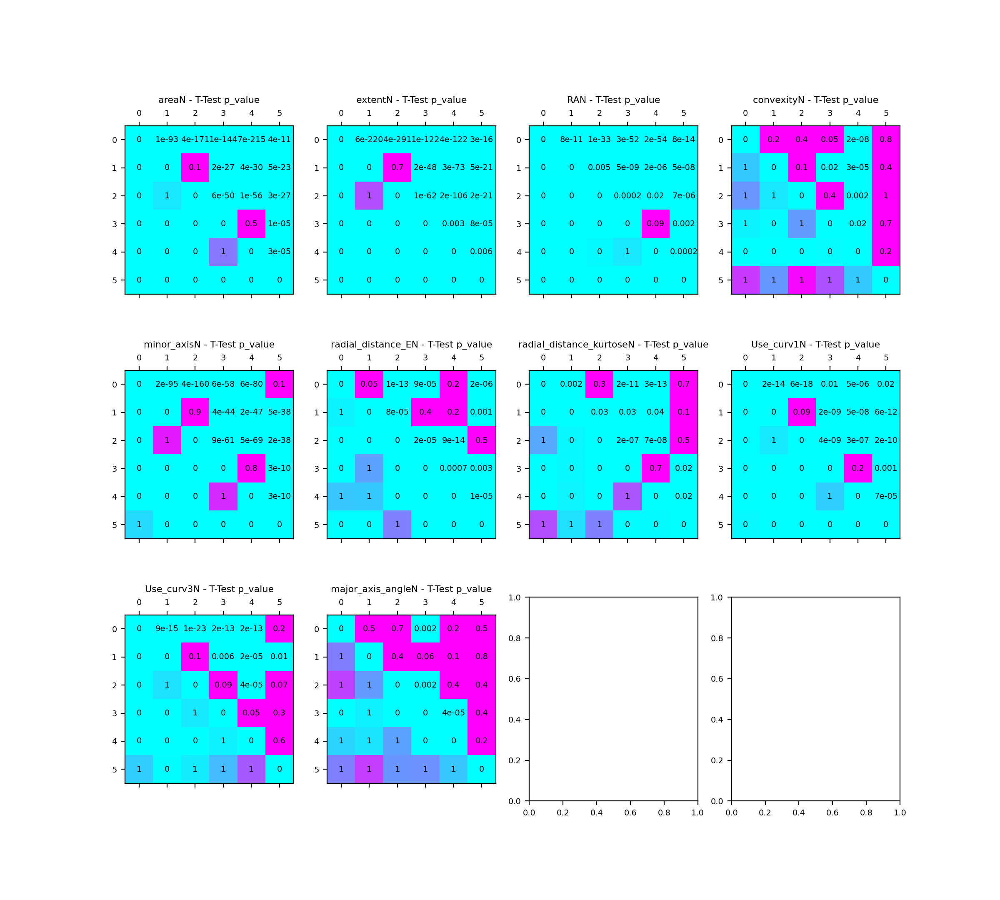

In [76]:
utils.shapeFeatures_extraction.plot_pvalues_variables(stats, vars, c=4, l=3)

Consideration: the following features present enough similarity distributions among normal and lesions classes, or among high grade lesions (3,4,5) and low grade lesions (1,2) classes. All those features were excluded.    
* Convexity: 0(Normal), 1 (ASCUS), 2(LSIL), 3(ASCH), 5(SCC)
* Minor_axis: 0(Normal), 5(SCC)
* radial_distance_Entropy: 2(LSIL) e 5 (SCC)
* radial_distance_kurtose: 1(ASCUS) e 4(HSIL)
* Use_curv3
* major_axis_angle






### Nucleo restantes ###

In [77]:
De_ = ['areaN', 'extentN', 'RAN', 'convexityN', 'minor_axisN', \
        'radial_distance_EN', 'radial_distance_kurtoseN',
        'Use_curv1N', 'Use_curv3N', 'major_axis_angleN']

cols_nucleo = ['bethesda','areaN', 'extentN', 'RAN', 'Use_curv1N']

## **Correlação entre atributos do Citoplasma das células** ##

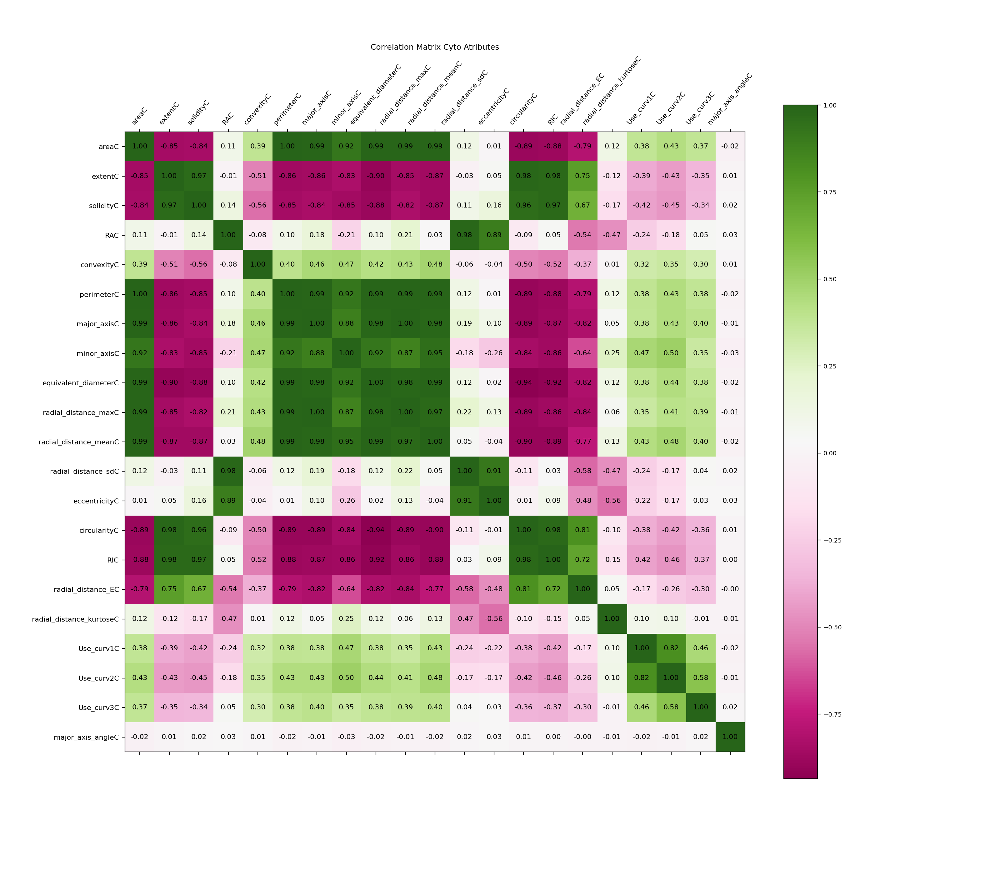

In [141]:
cols = ['areaC', 'extentC', 'solidityC', 'RAC', 'convexityC', \
       'perimeterC', 'major_axisC',  'minor_axisC', \
       'equivalent_diameterC',  'radial_distance_maxC', 'radial_distance_meanC', \
       'radial_distance_sdC',  'eccentricityC', 'circularityC', 'RIC', 'radial_distance_EC', 'radial_distance_kurtoseC', \
       'Use_curv1C', 'Use_curv2C', 'Use_curv3C', 'major_axis_angleC']


stats_1 = stats[cols]
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=50)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)
plt.title('Correlation Matrix Cyto Atributes', fontsize=9);
filename = 'CorrCito.pdf'

fig.savefig(fname="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/"+filename)
plt.show()

Conforme matriz acima, as correlações entre atributos do citoplasma são muito semelhantes às do nucleo. Para cada grupo de atributos com correlação > 0.75 apenas um dos atributos será mantido esse sendo diferente do atributo mantido para o núcleo:


1.   area, perimetro, **major_axis**, equivalent_diameter, radia_distance_max e radia_distance_mean. Major_axis será mantido.
2.   extent (Ratio of pixels in the region to pixels in the total bounding box), **solidity** (Ratio of pixels in the region to pixels of the convex hull image) e circularidade (p^2/($pi*A)) e RI (indice de rugosidade). Será mantida solidity.
3. RA (taxa  entre: distancias_radiais_maiores_que_a_média/(N* dist_radial_média), radial_distance_sdN (desvio padrão das distancias radiais) e **excentricidade** (perimetro_convexHull/perimetro) Será mantido excentricidade.


### Mat cor restantes ###

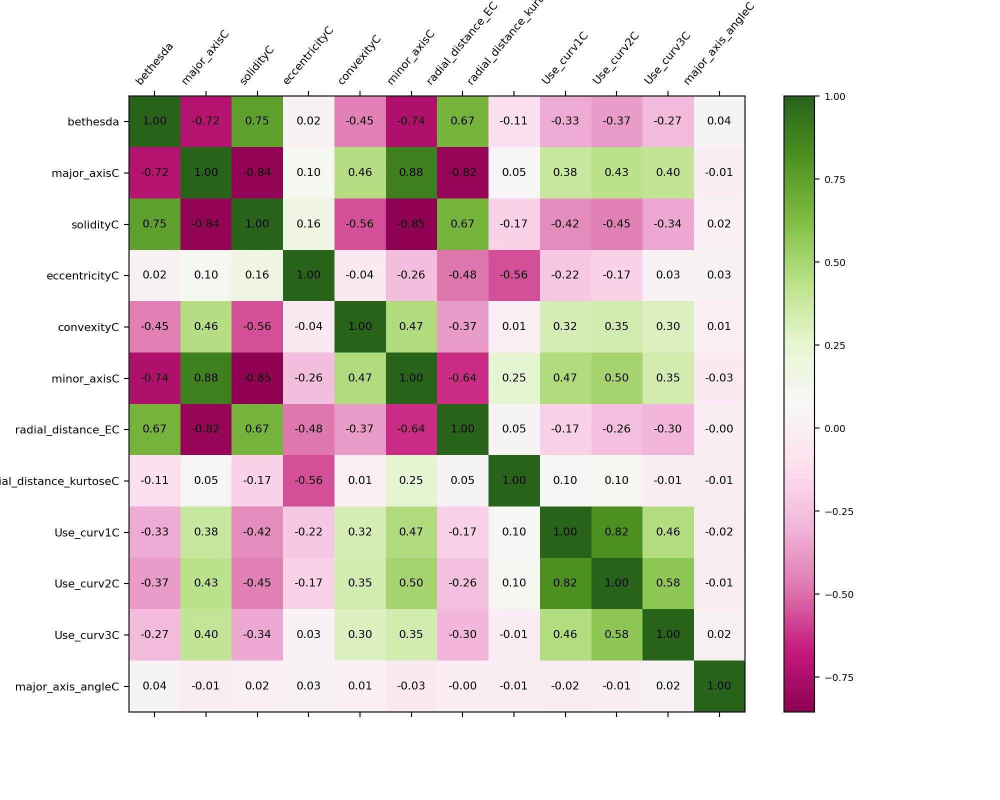

In [142]:
cols_cyto = ['bethesda','major_axisC', 'solidityC', 'eccentricityC', 'convexityC', 'minor_axisC', \
               'radial_distance_EC', 'radial_distance_kurtoseC', \
              'Use_curv1C', 'Use_curv2C', 'Use_curv3C', 'major_axis_angleC']

stats_1 = stats[cols_cyto]
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=50)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)


### **Analise de faixa dos atributos do citoplasma**

#### Python

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 15 x 10 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/CitoBoxplot.pdf


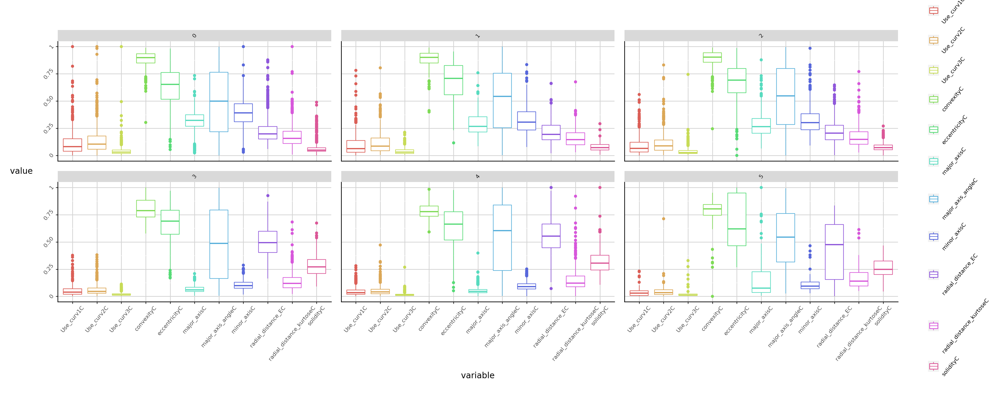

In [143]:
from plotnine import *
from plotnine.data import *


%matplotlib inline
cols_cyto = ['bethesda','major_axisC', 'solidityC', 'eccentricityC', 'convexityC', 'minor_axisC', \
               'radial_distance_EC', 'radial_distance_kurtoseC', \
              'Use_curv1C', 'Use_curv2C', 'Use_curv3C', 'major_axis_angleC']

stats_1_melt = pd.melt(stats[cols_cyto], id_vars='bethesda')

p = ggplot(stats_1_melt, aes(x= 'variable', y= 'value', col=stats_1_melt.variable, \
                         color= stats_1_melt.variable)) + \
 geom_boxplot() + facet_wrap('~ bethesda') + \
 theme(figure_size=(20,8), \
       axis_line=element_line(size=1, colour="black"), \
         panel_grid_major=element_line(colour="#d3d3d3"), \
       text=element_text(size=8, angle=50), \
            panel_border=element_blank(), \
        panel_background=element_blank(), \
      axis_title_x = element_text(size=12, angle = 0), \
      axis_title_y = element_text(size=12, angle=0))
filename = 'CitoBoxplot.pdf'
ggsave(p,filename =filename, path ="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis", width=15, height=10)
p.draw()



#### R  

In [144]:
cols_cyto = ['bethesda','major_axisC', 'solidityC', 'eccentricityC', 'convexityC', 'minor_axisC', \
               'radial_distance_EC', 'radial_distance_kurtoseC', \
              'Use_curv1C', 'Use_curv2C', 'Use_curv3C', 'major_axis_angleC']
statsC = stats[cols_cyto]
statsC.to_csv("/content/drive/MyDrive/PDSE/statsC.csv")

New names:
• `` -> `...1`


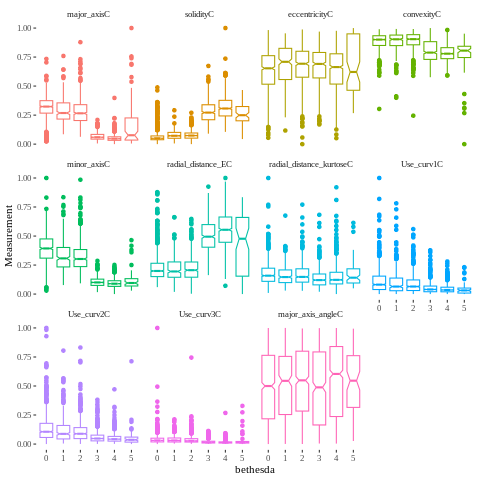

In [145]:
%%R
statsR <- read_csv("/content/drive/MyDrive/PDSE/statsC.csv",col_types =
                   cols(...1 = col_skip(), bethesda = col_factor(levels = c("0","1", "2", "3", "4", "5"))))
statsR.molten <- reshape2::melt(statsR, measure.vars=2:12, value.name = "Measurement", variable.name="Feature")

library(repr)
saved <- options(repr.plot.width=100, repr.plot.height=800)

pl = ggplot(statsR.molten, aes(x=bethesda, y=Measurement, col=Feature)) +
  geom_boxplot(show.legend = FALSE, notch=TRUE) +
  theme_tufte() +
  facet_wrap(~Feature)

print(pl, saved=grid::viewport(width=unit(20, 'inch'), height=unit(20, 'inch')))

#### **T-Test - teste das médias para valores de atributos entre classes**

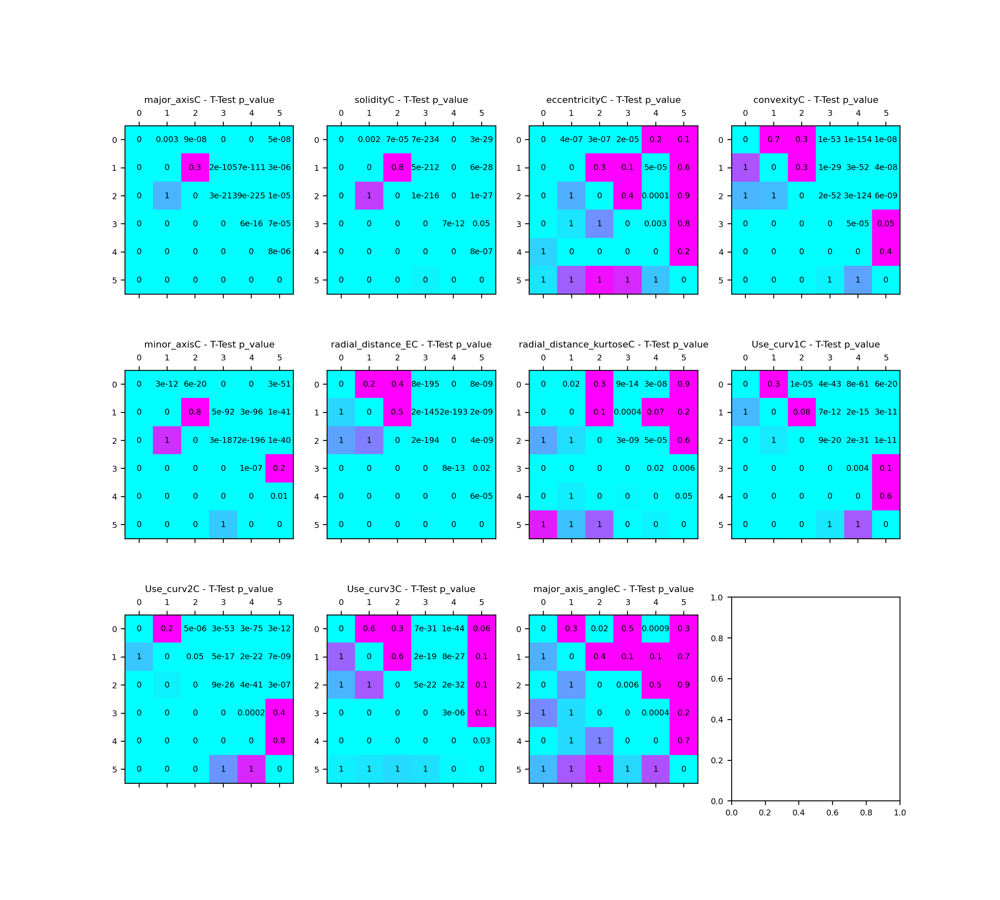

In [146]:
vars = ['major_axisC', 'solidityC', 'eccentricityC', 'convexityC', 'minor_axisC', \
               'radial_distance_EC', 'radial_distance_kurtoseC', \
              'Use_curv1C', 'Use_curv2C', 'Use_curv3C', 'major_axis_angleC']
utils.shapeFeatures_extraction.plot_pvalues_variables(stats, vars, c=4, l=3)

Consideration: the following features present enough similarity distributions among normal and lesions classes, or among high grade lesions (3,4,5) and low grade lesions (1,2) classes. All those features were excluded.   
* eccentricity
* convexity
* minor_axis
* radial_distance_entropy
* radial_distance_kurtose
* Use_curv1, Use_curv2, Use_curv3
* major_axis_angle

#### Cito restantes ####

In [147]:
De_ = ['major_axisC', 'solidityC', 'eccentricityC', 'convexityC', 'minor_axisC', \
               'radial_distance_EC', 'radial_distance_kurtoseC', \
              'Use_curv1C', 'Use_curv2C', 'Use_curv3C', 'major_axis_angleC']

cols_cyto = ['bethesda','major_axisC', 'solidityC']

## Correlação entre os atributos relacionados à célula

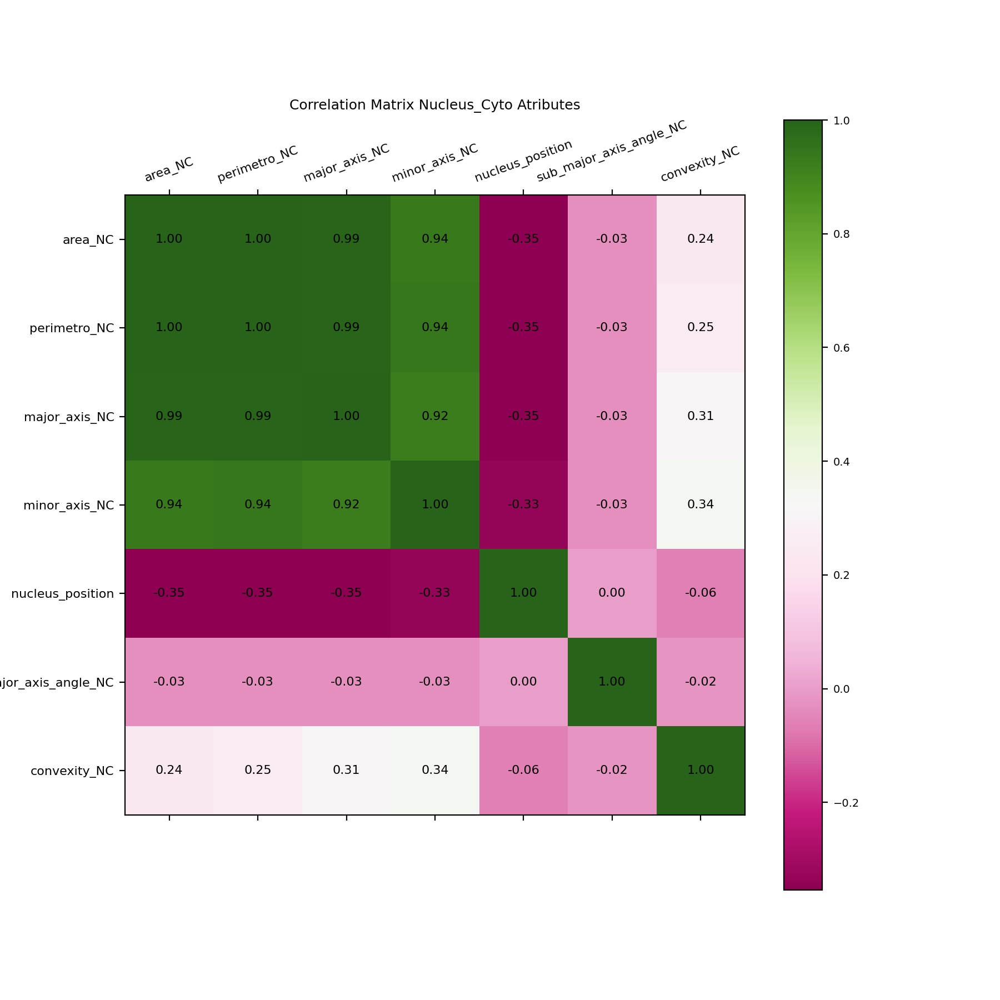

In [165]:
cols_NC = ['area_NC', 'perimetro_NC', 'major_axis_NC', 'minor_axis_NC', 'nucleus_position', \
           'sub_major_axis_angle_NC', 'convexity_NC']

stats_1 = stats[cols_NC]
fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot()
fi = ax.matshow(stats_1.corr(), cmap= 'PiYG')
ax.matshow(stats_1.corr(), cmap='PiYG')

for (i, j), z in np.ndenumerate(stats_1.corr()):
    ax.text(j, i, '{:0.2f}'.format(z), fontsize=8, ha='center', va='center')

plt.xticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8, rotation=20)
plt.yticks(range(stats_1.select_dtypes(['number']).shape[1]), stats_1.select_dtypes(['number']).columns, fontsize=8)

cb = fig.colorbar(fi)
cb.ax.tick_params(labelsize=7)
plt.title('Correlation Matrix Nucleus_Cyto Atributes', fontsize=9);
filename = 'CorrNC.pdf'
fig.savefig(fname="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/"+filename)
plt.show()




**A matriz acima mostra forte correlação entre as taxas Nucleus/Cytomplasm: **
* area, perimetro, minor_axis e major_axis* : area_NC mantida 
   


### Analise de faixa

#### Python

In [166]:
cols_NC = ['bethesda', 'area_NC', 'nucleus_position', 'sub_major_axis_angle_NC', 'convexity_NC']
stats_1 = stats[cols_NC]

In [167]:
stats_1_melt = pd.melt(stats_1, id_vars='bethesda')


/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 15 x 10 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis/Cellboxplot.pdf


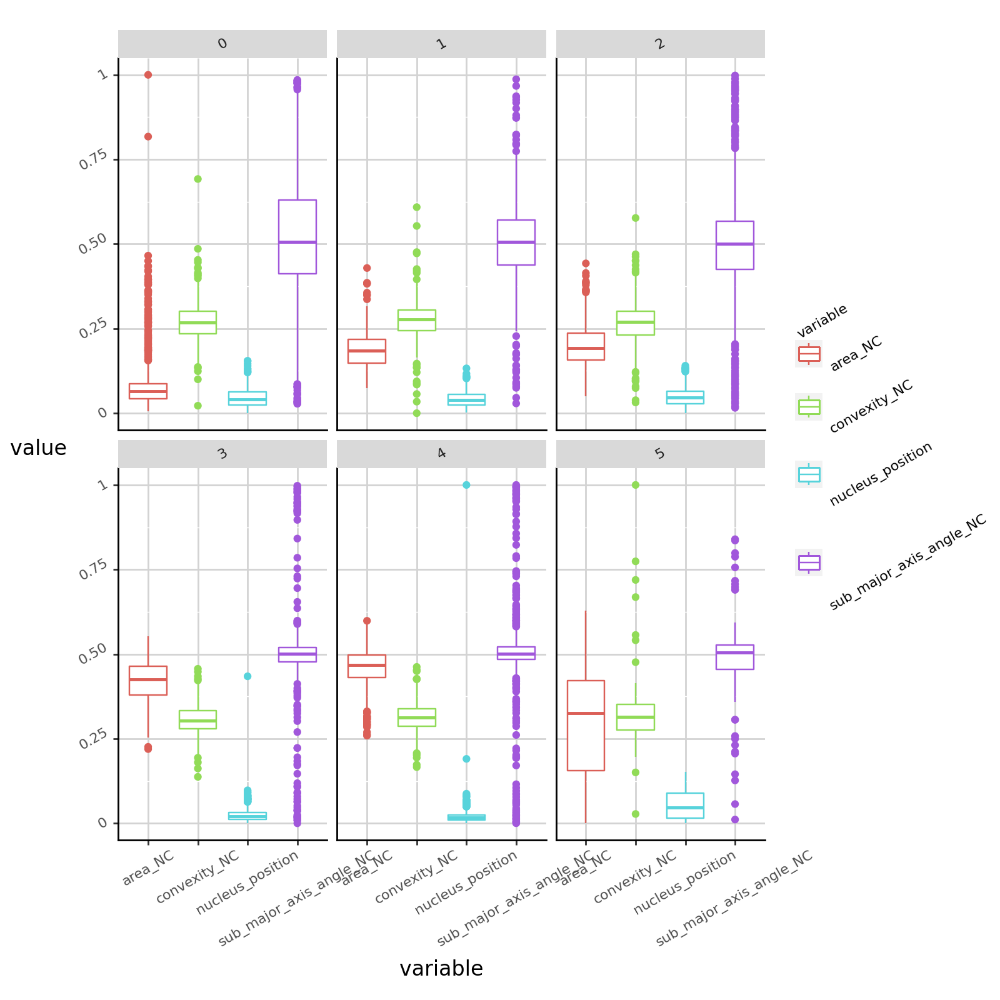

In [168]:
p = ggplot(stats_1_melt, aes(x= stats_1_melt.variable, y= stats_1_melt.value, col= stats_1_melt.variable, \
                         color= stats_1_melt.variable)) + \
 geom_boxplot() + facet_wrap('~ bethesda') + \
 theme(figure_size=(8,8), \
       axis_line=element_line(size=1, colour="black"), \
         panel_grid_major=element_line(colour="#d3d3d3"), \
       text=element_text(size=8, angle=30), \
            panel_border=element_blank(), \
        panel_background=element_blank(), \
      axis_title_x = element_text(size=12, angle = 0), \
      axis_title_y = element_text(size=12, angle=0))
filename = 'Cellboxplot.pdf'
ggsave(p,filename =filename, path ="/content/drive/MyDrive/PDSE/ShapeBased_multivar_analysis", width=15, height=10)
p.draw()


#### R

In [169]:
cols_NC = ['bethesda', 'area_NC', 'nucleus_position', 'sub_major_axis_angle_NC', 'convexity_NC']
statsNC = stats[cols_NC]
statsNC.to_csv("/content/drive/MyDrive/PDSE/statsNC.csv")

New names:
• `` -> `...1`


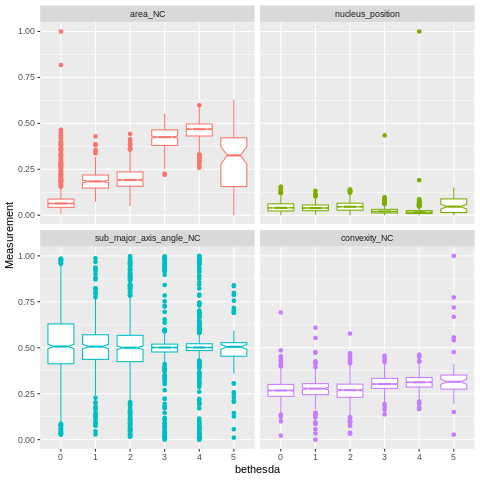

In [170]:
%%R
statsR <- read_csv("/content/drive/MyDrive/PDSE/statsNC.csv",col_types =
                   cols(...1 = col_skip(), bethesda = col_factor(levels = c("0","1", "2", "3", "4", "5"))))
statsR.molten <- reshape2::melt(statsR, measure.vars=2:5, value.name = "Measurement", variable.name="Feature")

library(repr)
saved <- options(repr.plot.width=100, repr.plot.height=800)
pl = ggplot(statsR.molten, aes(x=bethesda, y=Measurement, col=Feature)) +
  geom_boxplot(show.legend = FALSE, notch = TRUE) +
  #theme_tufte() +
 facet_wrap(~Feature)

print(pl, saved=grid::viewport(width=unit(20, 'inch'), height=unit(20, 'inch')))

#### **T-Test - teste das médias para valores de atributos entre classes**

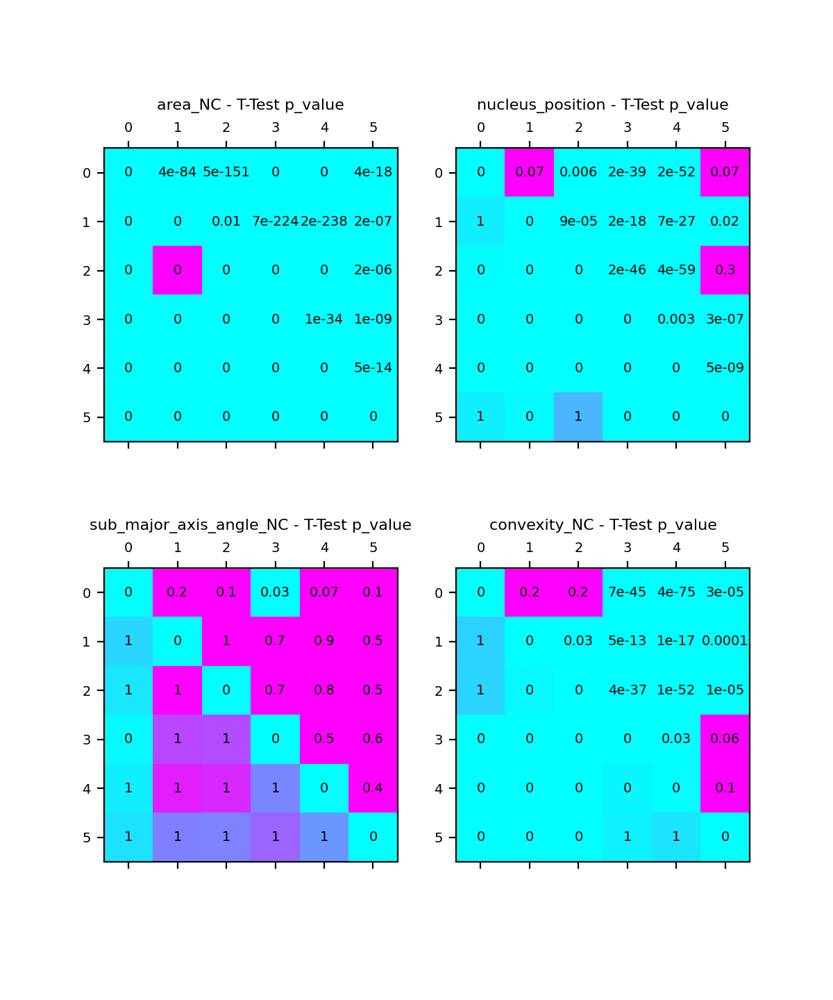

In [171]:
vars = ['area_NC', 'nucleus_position', 'sub_major_axis_angle_NC', 'convexity_NC']
utils.shapeFeatures_extraction.plot_pvalues_variables(stats, vars, c=2, l=2)


**Consideration: **
 * nucleus position
 * sub_major_axis_angle
 * convexidade

Permanece **area_NC**

## Features selecionadas

In [172]:
 cols_all = ['bethesda','areaN', 'extentN', 'RAN', 'Use_curv1N', 'solidityC', 'major_axisC', 'area_NC']
 stats_2 = stats[cols_all]

### Distribuição densidades

In [173]:
stats_2_melt = pd.melt(stats_2, id_vars='bethesda')


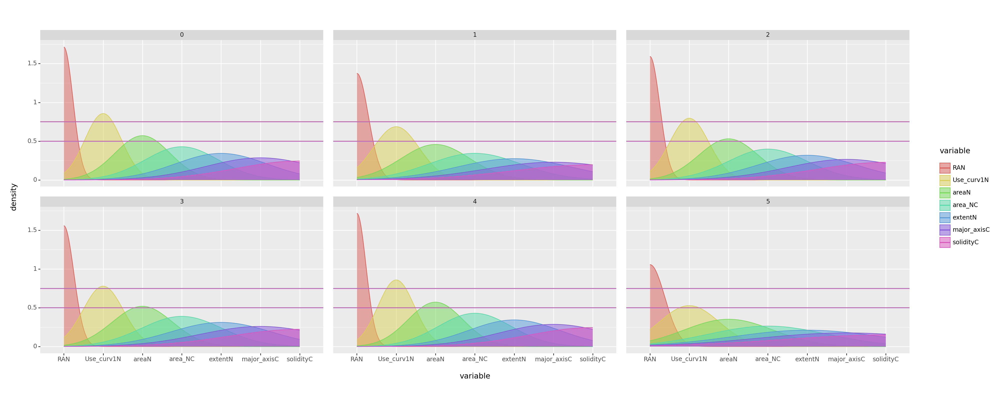

In [174]:
p = ggplot(stats_2_melt, aes(x= stats_2_melt.variable, fill = stats_2_melt.variable, color= stats_2_melt.variable))  \
+ geom_density(alpha=0.5, position="identity") + facet_wrap("~bethesda") + theme(figure_size=(20, 8)) \
+ geom_hline(stats_2_melt, aes(yintercept= 0.75, colour= stats_2_melt.variable)) +  geom_hline(stats_2_melt, aes(yintercept= 0.5, color= stats_2_melt.variable))
p.draw()

**Distribuições 0-4(Normal-HSIL), 2-3(LSIL-ASCH) muito semelhantes...**

### Analise distribuição em pares

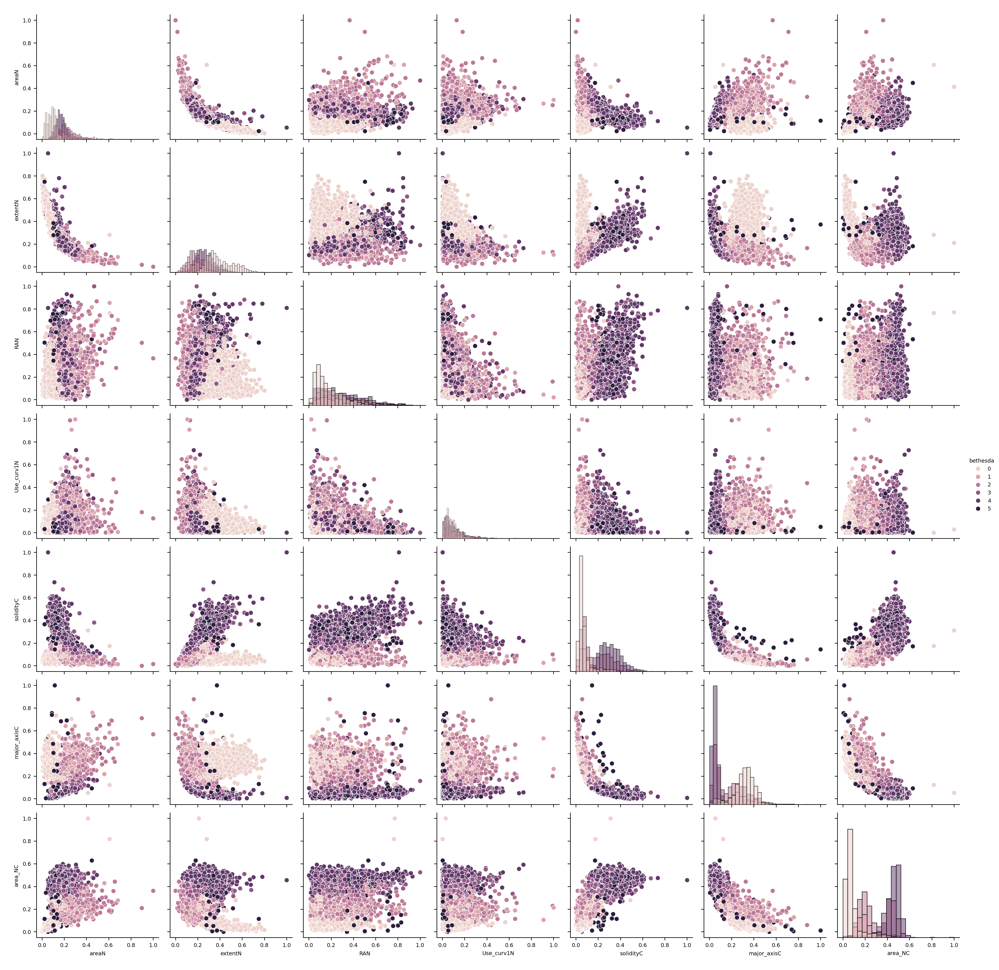

In [175]:
import seaborn as sns
cols_all = ['bethesda','areaN', 'extentN', 'RAN', 'Use_curv1N', \
             'solidityC', 'major_axisC', 'area_NC']
stats_2 = stats[cols_all]

g = sns.PairGrid(stats_2, hue="bethesda")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)
g.add_legend()

Relações (?) entre:

*  SolidityC com Major_axis_C  
*  Minor_axisC com Major_axisC
*  Area_N com ExtentN

# **Testes de Classificação**
See complete comparisions of results in the notebook 'classifications.ipynb' 

In [176]:
cols_all = ['bethesda','areaN', 'extentN', 'RAN', 'Use_curv1N', 'solidityC', 'major_axisC', 'area_NC']
stats_2 = stats[cols_all]

In [177]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

#X = stats[['areaN', 'extentN', 'RAN', 'minor_axisC', 'area_NC']]
X = stats[['areaN', 'extentN', 'RAN', 'Use_curv1N','solidityC', 'major_axisC', 'area_NC']]
y = stats[['bethesda']]
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size = 0.5, random_state=0)

clf = Pipeline(
    steps=[("knn", KNeighborsClassifier(n_neighbors=2))]
)

### KNN

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


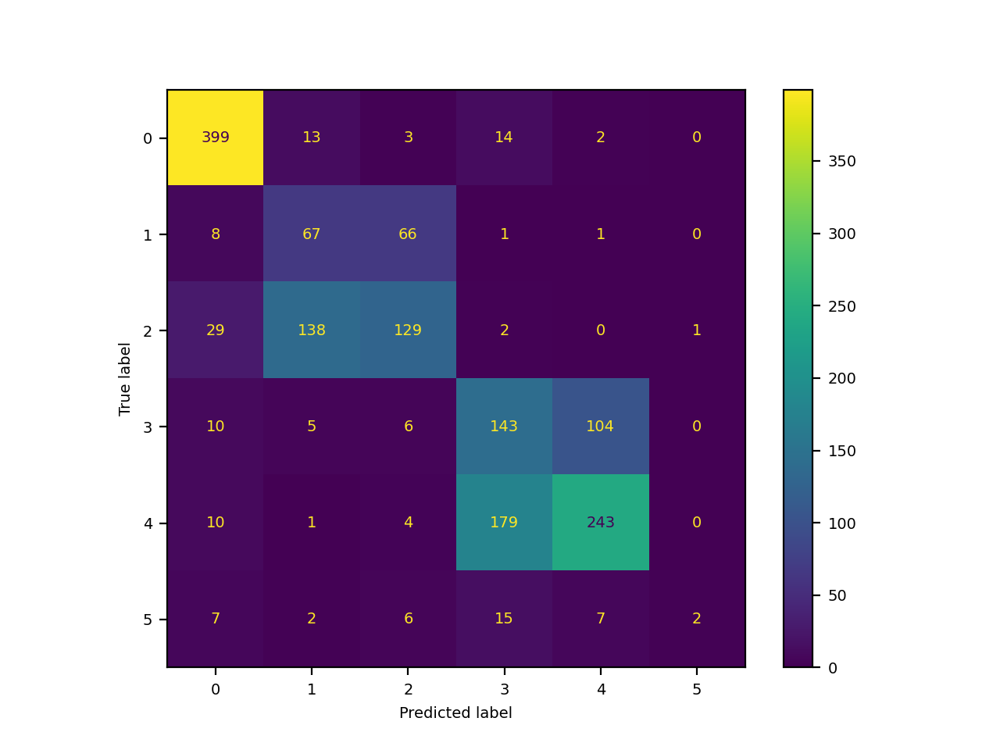

In [178]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.metrics import ConfusionMatrixDisplay, recall_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

clf.fit(X_train, y_train)
SVC(random_state=0)
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test)
plt.show()

In [179]:
recall_score(y_test, clf.predict(X_test), average='weighted')

0.6079158936301794

### SVM

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


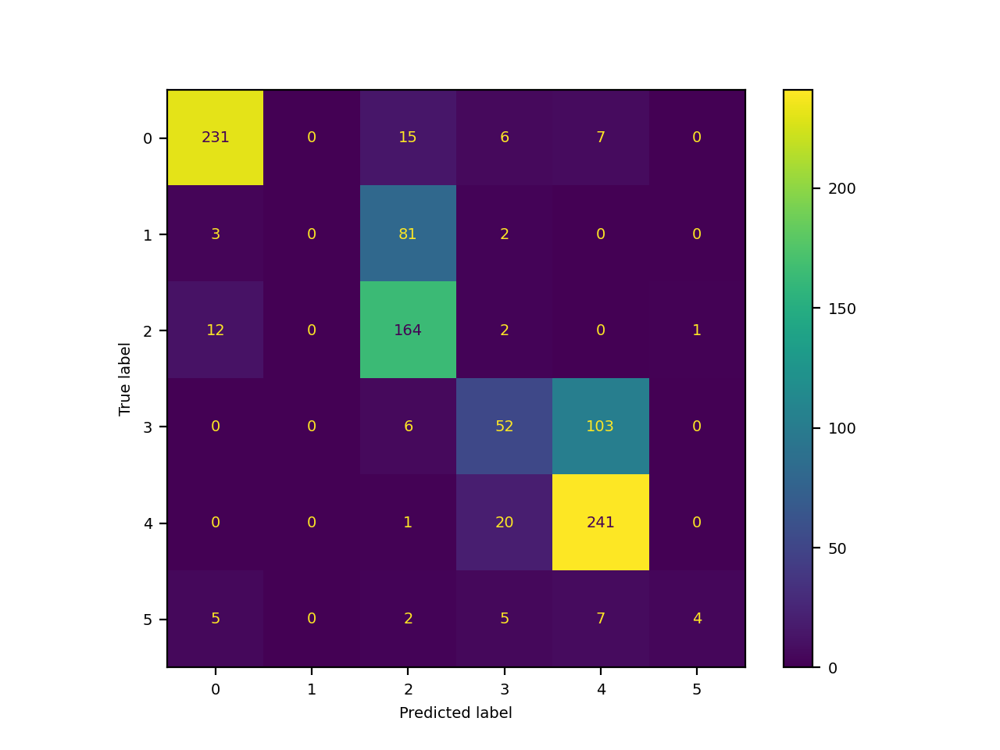

In [180]:
from sklearn.svm import SVC
clf = SVC(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size = 0.3, random_state=0)
clf.fit(X_train, y_train)
SVC(random_state=0)
ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test)
plt.show()

In [181]:
recall_score(y_test, clf.predict(X_test), average='weighted')

0.7134020618556701